load checkpoint from local path: save_files_and_logs/latest.pth


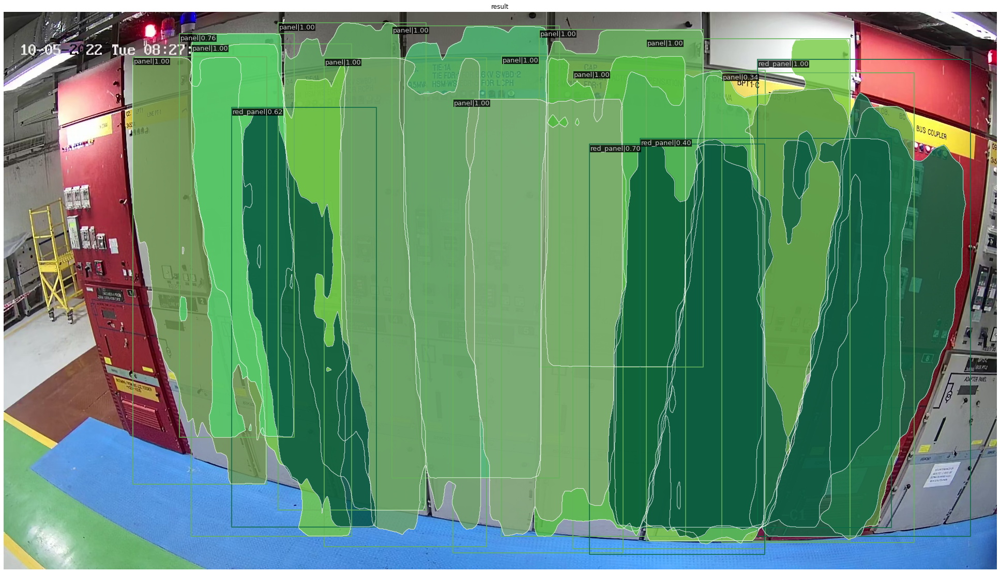

In [5]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
# https://github.com/open-mmlab/mmdetection/tree/master/configs/mask_rcnn/mask_rcnn_r101_fpn_2x_coco.py
config = 'configs/mask_rcnn/mask_rcnn_r101_fpn_2x_coco.py'
# Setup a checkpoint file to load change to latest.pth
checkpoint = 'save_files_and_logs/latest.pth'
# checkpoint = 'save_files_and_logs/epoch_26.pth'


# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None
config.dataset_type = 'COCODataset'
config.model.roi_head.bbox_head.num_classes = 2
config.model.roi_head.mask_head.num_classes = 2

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

# Use the detector to do inference
img = '../Data/1/1652950879.9174056.jpg'
result = inference_detector(model, img)

# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.3)

0.9999


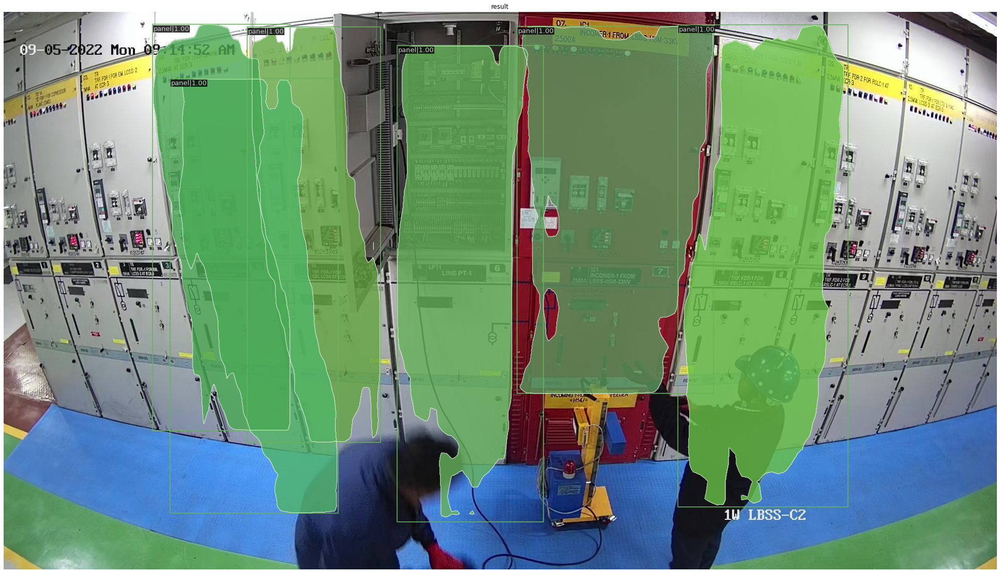

In [10]:
img = '../Data/2/1652951797.7189376.jpg'
result = inference_detector(model, img)
eps = 1e-4
print(1 - eps)

# Let's plot the result
show_result_pyplot(model, img, result, score_thr=1 - eps)

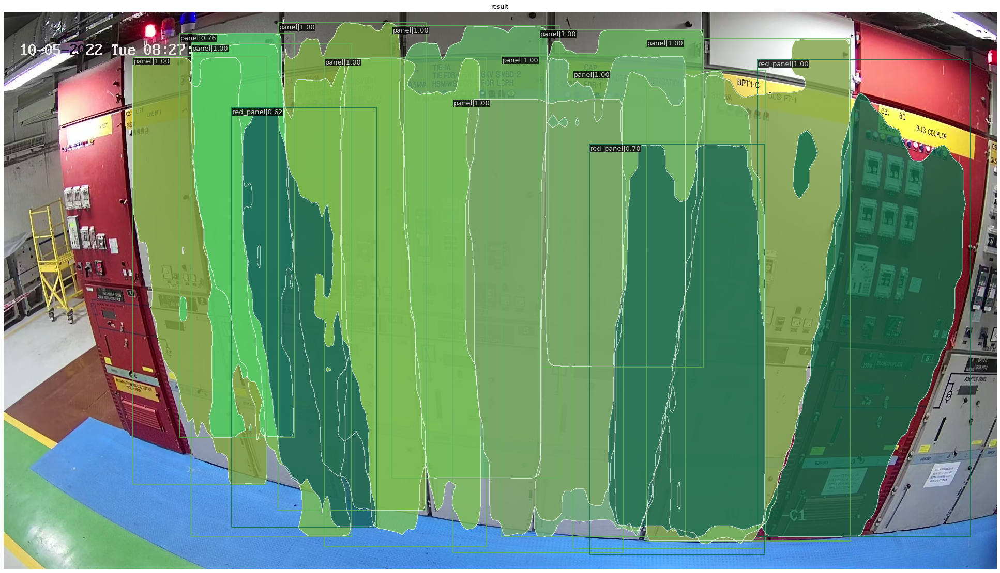

In [12]:
img = '../Data/1/1652950879.9174056.jpg'
result = inference_detector(model, img)

# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.5)

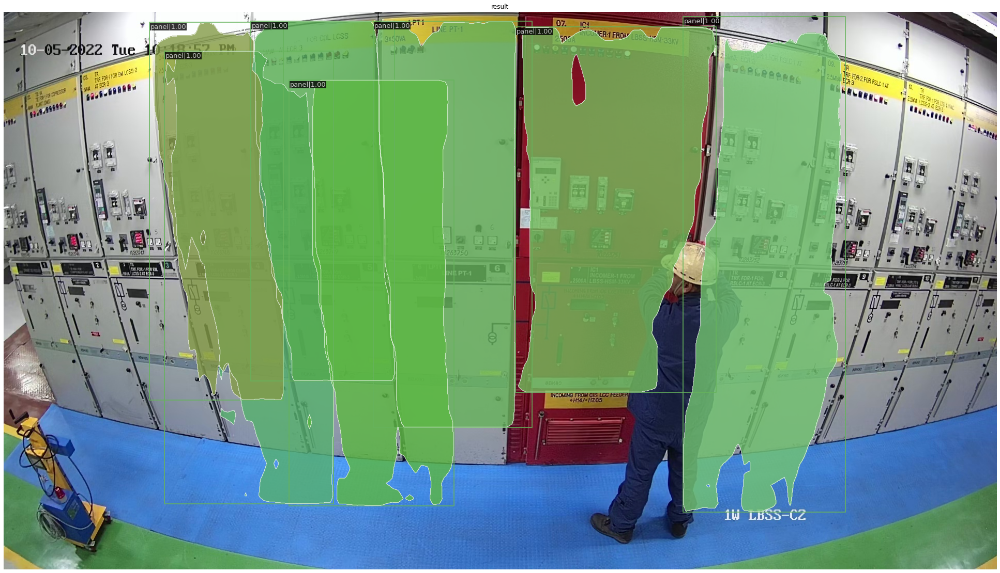

In [4]:
# 1652953904.1220944.jpg
img = './mask-rcnn/train/images/1652953904.1220944.jpg'
result = inference_detector(model, img)

# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.9999)